# Topic 28. Lagrange Multipliers
Author: Ian Syndergaard


## Introduction
Constrained optimization is a common engineering problem.  Constrained optimization refers to minimizing a *cost function* (or maximizing a *reward function*) given that the variables being optimized must meet some condition (called a *constraint*).  In this tutorial, we will refer to the cost function as $ f(x,y,z,...) $.

There is a special class of constraints called *equality constraints*.  An equality constraint is a constraint which can be written in the form $ h(x,y,z,...) = 0 $, where $ (x,y,z,...) $ are the variables being optimized.  In other words, there is a function of the variables which *must* equal zero.

### example
Imagine that you want to start an icecream making business.  In order to make icecream, you must purchase ingredients, the price of which will be denoted by $ i $.  You must also hire a worker and pay him for his work.  The amount he is paid for his work will be denoted by $ w $.  You then wish to maximize your revenue selling icecream.  The revenue will be denoted by $ R $.  Note that the more ingredients you buy and the more your employee works, the more icecream you can make and sell, and thus the higher your revenue can be.  Thus, $ R $ is a function of $ i $ and $ w $ (i.e. $ R(i,w) $ ).  We will let our cost function be $ f(i,w) = - R(i,w) $.  Thus, minimizing $ f(i,w) $ will maximize the revenue.

As posed, this is an *unconstrained* optimization problem.  However, in real life we would have constraints that we must abide by.  For example, imagine that while creating this icecream business we must abide by a budget.  Let's say we wish to invest \$10,000.  We now have the constraint $ i + w = \$10,000 $.

Note that our constraint is not yet of the form $ h(i,w) = 0 $.  However, this is easily accomplished by rearanging our constraint as $ i + w - \$10,000 = 0 $.  Thus, $ h(i,w) = i + w - \$10,000 $.  We now have an optimization problem with an equality constraint: minimize $ f(i,w) $ subject to $ h(i,w) = 0 $.

## Explanation of the theory using an example
Let's say that we wish to minimize $ f(x,y) = sin(x) + \frac{1}{2} y^2 $ with respect to $ x $ and $ y $.  We also require that $ x $ and $ y $ lie on a circle of radius two centered at $ (x,y) = (0,3)$.  In other words, we have the constraint $ x^2 + (y-3)^2 = 2^2 $.

The following is a plot of $ f(x,y) $ superimposed with the constraint.



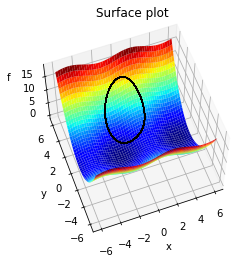

In [154]:
import matplotlib
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

# We wish to minimize F with respect to X and Y
x = np.arange(-6,6,0.01)
y = np.arange(-6,6,0.01)
X, Y = np.meshgrid(x,y)
F = np.sin(X) + 0.5*Y**2
dFdX = np.cos(X)
dFdY = Y

# We wish to apply the equality constraint x^2 + (y-3)^2 = 2^2 (i.e. x and y must lie on a circle of radius 2 centered at (0,3) )
dtheta = 0.01
h_theta = np.arange(0, 360 + dtheta, dtheta)
h_x = 2*np.cos(h_theta)
h_y = 2*np.sin(h_theta) + 3
h_f = np.sin(h_x) + 0.5*h_y**2

# 3D plot
fig1 = plt.figure()
ax1 = plt.axes(projection='3d')
ax1.plot_surface(X, Y, F, cmap=cm.jet, edgecolor='none', zorder=1)
ax1.plot(h_x,h_y,h_f,c='k',linewidth=1, zorder=3)
ax1.set_title('Surface plot')
ax1.set_ylabel('y')
ax1.set_xlabel('x')
ax1.set_zlabel('f')
ax1.view_init(60,-110)

We are looking for the point on the circle which has the lowest value of $ f $.  It's easy to point to that spot on the plot, but actually solving for it will require some clever mathematics.

Let's look at this plot as a set of countour lines (also called level curves).  We will also include our constraint in black.

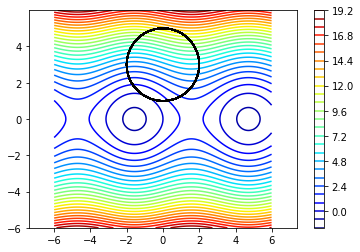

In [155]:
# Contour Plot
fig2, ax2 = plt.subplots(1,1)
CS = ax2.contour(X, Y, F, 24, cmap=cm.jet)
ax2.plot(h_x,h_y,c='k')
plt.axis('equal')
CB = fig2.colorbar(CS)

plt.show()

Note that we can find an $ x $ and $ y $ which meet our constraint and which will yield $ f(x,y) $ for any level curve that intersects the constraint.

For example, we could find values for $ x $ and $ y $ which would yield $ f(x,y) = 10 $; however, there are no values of $ x $ and $ y $ which meet the constraint and yield $ f(x,y) = 0.6 $.  (Note that $ f(x,y) = 0.6 $ is the lowest level curve in this plot, and it does not intersect the constraint.  We simply cannot do as well as $ f(x,y) = 0.6 $ while meeting our constraint.)

Note also that the lowest level curve we could ever reach is one that is *tangent* to the constraint.  In other words, _**at the constrained optimum, the cost function and the constraint are tangent**_!

In order to find the point (or points) where the cost function and the constraint are tangent, we can use the gradients of the cost function ($ \nabla f(x,y) $) and the constraint ($ \nabla h(x,y) $).  The gradient field of the cost function is depicted below.

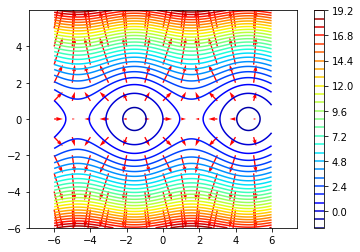

In [188]:
# To avoid clutter in the graph, we will use a coarser grid to plot the gradient
x_coarse = np.arange(-6,6,1)
y_coarse = np.arange(-6,6,1)
X_coarse, Y_coarse = np.meshgrid(x_coarse,y_coarse)
F_coarse = np.sin(X_coarse) + 0.5*Y_coarse**2
dFdX_coarse = np.cos(X_coarse)
dFdY_coarse = Y_coarse

# Contour Plot
fig3, ax3 = plt.subplots(1,1)
CS = ax3.contour(X, Y, F, 24, cmap=cm.jet)
ax3.quiver(X_coarse, Y_coarse, dFdX_coarse, dFdY_coarse, units='xy', color='r', scale=2)
plt.axis('equal')
CB = fig3.colorbar(CS)

plt.show()

Note that the gradient field is always *perpendicular* to the cost function.

This is true in general.  The gradient is, by definition, in the direction of steepest ascent.  If you start at a level curve and you wish to ascend as rapidly as possible, you should head perpendicular to the level curve.  If you travel in any other direction, a portion of the travel will move you along the level curve, and thus a portion of that travel was "wasted".  Therefore, the direction of steepest ascent (or descent) is always perpendicular to the level curve.

Let's consider now the gradient of the constraint, $ \nabla h(x,y) $.

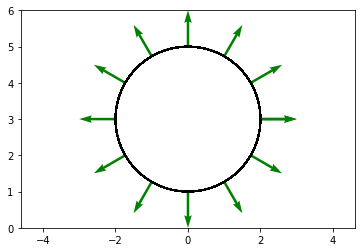

In [187]:
dtheta = 30
theta = np.pi/180*np.arange(0,360+dtheta,dtheta)
h_x_coarse = 2*np.cos(theta)
h_y_coarse = 2*np.sin(theta) + 3
h_dx = 2*h_x_coarse
h_dy = 2*(h_y_coarse - 3)

fig4, ax4 = plt.subplots(1,1)
ax4.plot(h_x, h_y, color='k')
ax4.quiver(h_x_coarse, h_y_coarse, h_dx, h_dy, units='xy', color='g', scale=4)
plt.axis('equal')
plt.ylim(0,6)
plt.show()

Of course, $ \nabla h(x,y) $ is perpendicular to the constraint as we have already discussed.
Let's now put these all together.  We will plot the cost function with its gradient field and the constraint with its gradient.  We will also zoom in on the point of tangency.

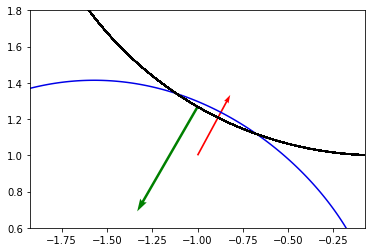

In [186]:
fig5, ax5 = plt.subplots(1,1)
ax5.contour(X, Y, F, 10, cmap=cm.jet)
ax5.quiver(X_coarse, Y_coarse, dFdX_coarse, dFdY_coarse, units='xy', color='r', scale=3)
plt.axis('equal')

ax5.plot(h_x,h_y,color='k')
ax5.quiver(h_x_coarse, h_y_coarse, h_dx, h_dy, units='xy', color='g', scale=6)

plt.xlim(-1.5,-0.5) # Why doesn't this zoom in like it's supposed to?
plt.ylim(0.6,1.8)
plt.show()

The level curve depicted here isn't quite tangent to the constraint, but it's close (a contour at a slightly lower value for $ f(x,y) $ would be tangent).  However, it illustrates that at a point of tangency, the gradient of the cost function and the gradient of the constraint are *proportional*.  That is, they either point in the same direction or they point in opposite directions.

Because this is true at all points of tangency, we can find all points of tangency by calculating the gradient of the cost function, $ \nabla f(x,y) $, and the gradient of the constraint, $ \nabla h(x,y) $, and setting them equal to each other with a proportionality constant, $ \lambda $.

That is, $$ \nabla f(x,y) = \lambda \nabla h(x,y) $$

The proportionality constant, $ \lambda $, is called a *Lagrange Multiplier*.

For our example problem, $ \nabla f(x,y) = \begin{bmatrix} cos(x) \\ y \end{bmatrix} $
<br>and $ \nabla h(x,y) = \begin{bmatrix} 2x \\ 2(y-3) \end{bmatrix} $

Thus, $$ \begin{bmatrix} cos(x) \\ y \end{bmatrix} = \lambda \begin{bmatrix} 2x \\ 2(y-3) \end{bmatrix} $$

We also have the constraint: $$ x^2 + (y-3)^2 = 2^2 $$

Thus, we have a system of three equations and three unknowns.  Their solution is the point (or points) of tangency between cost function and constraint.  Thus the solution (or one of the solutions if there are multiple solutions) is the constrained optimum.

$$ cos(x) = \lambda 2x $$
$$ y = \lambda 2(y-3) $$
$$ x^2 + (y-3)^2 = 2^2 $$

This system of equations has two solutions:
$$ \lambda_1 = 1.263, x_1 = 0.3692, y_1 = 4.966 $$
and
$$ \lambda_2 = -0.3411, x_2 = -0.9052, y_2 = 1.217 $$
One of these solutions corresponds to the constrained minimum.  The other corresponds to the constrained maximum (becuase the cost function and the constraint are also tangent at the constrained maximum).
$$ f(x_1,y_1) = 12.6896 $$
$$ f(x_2,y_2) = -0.04653 $$

Thus, the constrained minimum is at $ (x_2,y_2) = (-0.9052,1.217) $.

## An Engineering Application


## Challenge Problem